In [1]:
import sys
sys.path.insert(0, '..')
from motif_learning import MotifLearner
import mat73
import numpy as np
import matplotlib.pyplot as plt
import requests
import yfinance as yf

## Downloading DNA sequence data

In [8]:
# Define the stock symbol and time period
stock_symbol = "AAPL"  # Example: Apple Inc.
start_date = "2016-12-03"
end_date = "2022-01-01"

# Download the stock market data
stock_data = yf.download(stock_symbol, start=start_date, end=end_date)

# Extract the 'Close' prices from the stock data
close_prices = stock_data['Close']

# Initialize the up, down, and unchanged time series
up_down_series = []

# Transform the data into up, down, or unchanged series
for i in range(1, len(close_prices)):
    diff = close_prices[i] - close_prices[i-1]
    if diff > 0:
        up_down_series.append("up")
    elif diff < 0:
        up_down_series.append("down")
    else:
        up_down_series.append("unchanged")

# Print the up, down, or unchanged time series
print(up_down_series)

[*********************100%***********************]  1 of 1 completed
['up', 'up', 'up', 'up', 'down', 'up', 'unchanged', 'up', 'up', 'up', 'up', 'up', 'down', 'up', 'up', 'down', 'down', 'down', 'up', 'down', 'up', 'up', 'up', 'up', 'up', 'down', 'down', 'up', 'down', 'down', 'up', 'up', 'down', 'up', 'up', 'up', 'down', 'down', 'up', 'down', 'up', 'up', 'up', 'up', 'up', 'down', 'up', 'up', 'up', 'down', 'up', 'up', 'up', 'down', 'up', 'up', 'up', 'up', 'down', 'up', 'down', 'up', 'down', 'down', 'up', 'up', 'down', 'up', 'up', 'down', 'up', 'down', 'up', 'down', 'down', 'up', 'up', 'up', 'down', 'down', 'up', 'up', 'down', 'down', 'down', 'down', 'down', 'up', 'down', 'up', 'down', 'down', 'up', 'down', 'up', 'up', 'down', 'up', 'down', 'up', 'up', 'down', 'down', 'up', 'up', 'up', 'down', 'up', 'up', 'down', 'down', 'down', 'up', 'up', 'up', 'down', 'down', 'up', 'down', 'up', 'down', 'up', 'up', 'down', 'up', 'up', 'down', 'down', 'down', 'up', 'down', 'down', 'down', 'up', 'down',

### Pre-processing

In [9]:
transl = {'up':0, 'down':1, 'unchanged':2}
inv_transl = {v:k for k, v in transl.items()}
dataset = [transl[i] for i in up_down_series]

## Motif learning

In [18]:
motifl = MotifLearner(sim_thresh=1, freq_thresh=10, l_motif_range=[4,10])
motifl.fit(dataset)
motif_list = motifl.get_motifs()
for motif in motif_list:
    print(" ".join([inv_transl[i] for i in motif]))

/Users/aksheykumar/miniforge3/envs/tf_m1/lib/python3.8/site-packages/scipy/sparse/_index.py:125: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


up up up up
up up up down
up up down up
up down up up
down up up down
up up down down
down down up down
down up down up
down up up up
up down down up
down up down down
down down up up
up down up down
up down down down
down down down up
down down down down
up up up up down
up up up down up
up up up up up
up up down up up
down down up down up
down up down up up
up down up up up
up up up down down
up down down up down
down up up up down
down up up up up
up down up down up
down up down up down
up down up up down
down up up down up
up down down up up
down down up up down
down up up down down
up up down down down
down down down up down
down up down down up
up up down down up
up down down down up
down down up up up
down down down up up
down up down down down
up up down up down
up down up down down
up up up up down up
up up up up up down
up up up down up up
down up up up up up
down up up down down down
up up up up up up
up up up up down down
up down up up up down


## Visualising motifs with interactive plot

In [13]:
motifl.matrix_plot()

interactive(children=(IntSlider(value=7, description='l_motif', max=10, min=4), Output()), _dom_classes=('widg…

## Analysis of how the motifs compose, and pruning

In [14]:
motif_comp_mtx, pruned_motif_list = motifl.motif_composition_analysis()

/Users/aksheykumar/Desktop/motif-learning/examples/../motif_learning/motif_learning.py:68: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(60, 3))


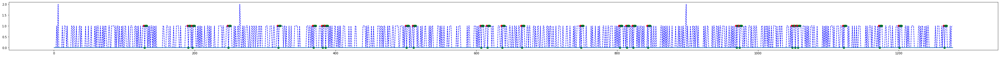

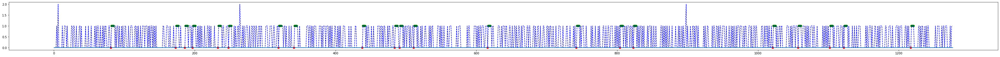

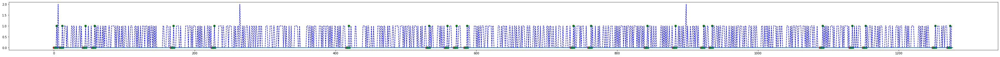

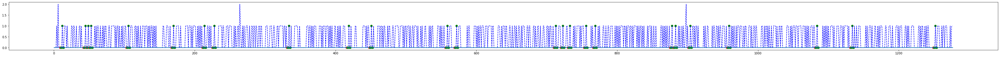

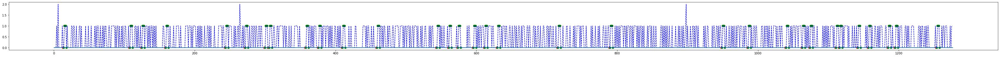

...

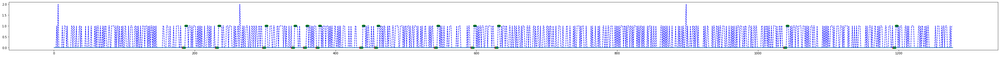

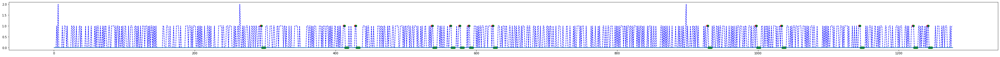

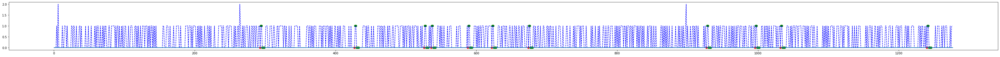

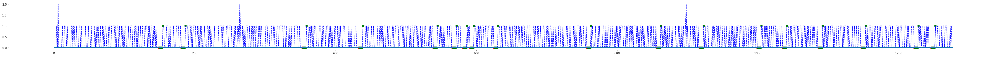

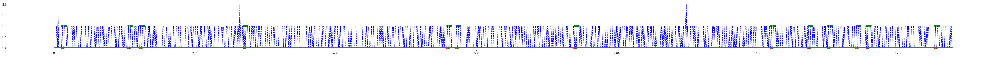

In [15]:
motifl.plot_motif_appearances(pruned=True)

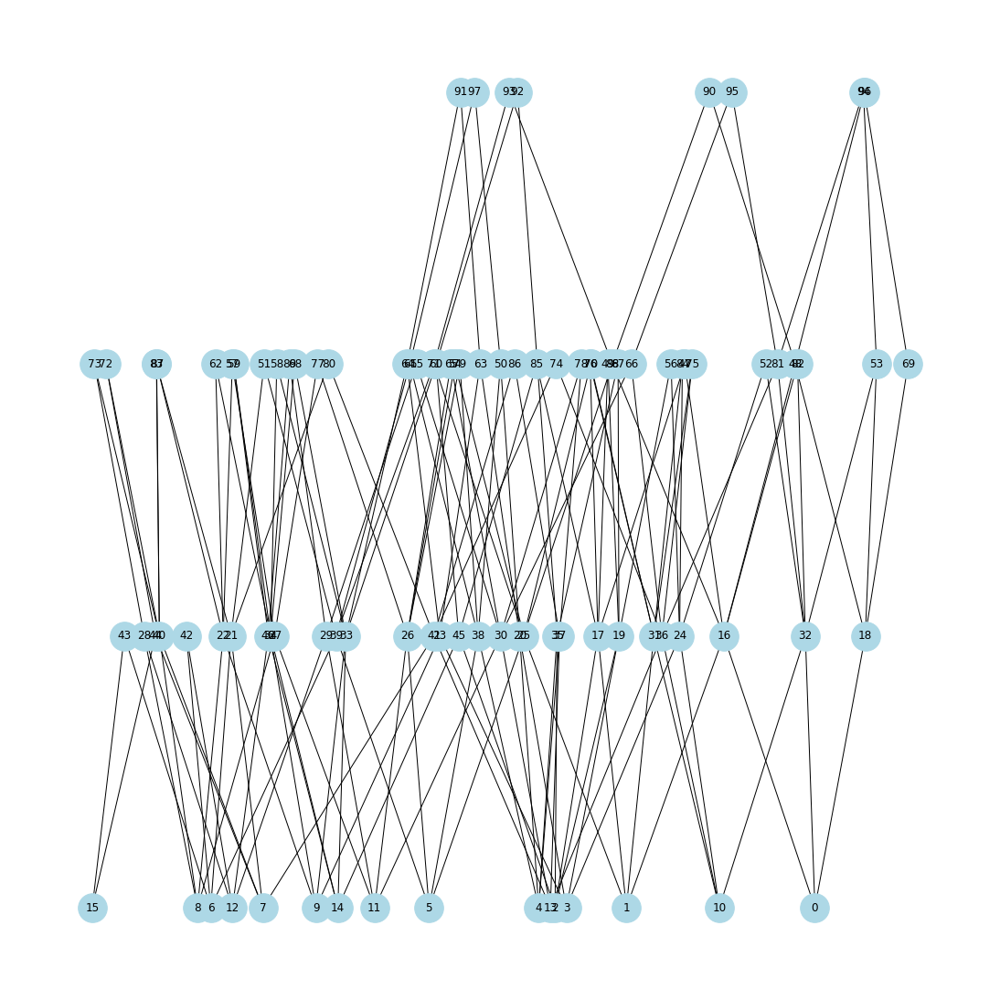

In [17]:
motifl.plot_motif_composition_graph()